# The power of Data Frames

> http://tonyfast.com/insight/2016/01/26/Parsing-the-Raw-Data.html

In [225]:
import pandas, bokeh, bokeh.plotting, jinja2, IPython, bokeh.charts
bokeh.plotting.output_notebook( resources=bokeh.resources.CDN )
%matplotlib inline

BokehJS successfully loaded.

In [226]:
df.head(2)

,index,CAMIS,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE DESCRIPTION,INSPECTION DATE,ACTION,VIOLATION CODE,VIOLATION DESCRIPTION,CRITICAL FLAG,SCORE,GRADE,GRADE DATE,RECORD DATE,INSPECTION TYPE
0,3624,40366711,LI GRECI'S STAATEN RESTAURANT,STATEN ISLAND,697,FOREST AVENUE ...,10310,7184486000,American,2015-06-03,No violations were recorded at the time of thi...,NaN,NaN,Not Applicable,NaN,NaN,NaN,2015-08-14,Administrative Miscellaneous / Initial Inspection
1,3625,40366711,LI GRECI'S STAATEN RESTAURANT,STATEN ISLAND,697,FOREST AVENUE ...,10310,7184486000,American,2015-02-05,Violations were cited in the following area(s).,04H,"Raw, cooked or prepared food is adulterated, c...",Critical,14,B,2015-02-05,2015-08-14,Cycle Inspection / Re-inspection


In [220]:
addresses.head(2)

,Unnamed: 0,CAMIS,address,boundingbox,class,display_name,importance,lat,licence,lon,osm_id,osm_type,place_id,type
0,0,40366711,"{'road': 'Forest Avenue', 'county': 'Richmond ...","['40.6295377', '40.6299373', '-74.1125261', '-...",building,"697, Forest Avenue, West New Brighton, Todt Hi...",0.301,40.629699,"Data © OpenStreetMap contributors, ODbL 1.0. h...",-74.112302,245483748,way,117798341,yes
1,1,40387243,"{'road': 'Watchogue Road', 'county': 'Richmond...","['40.6160166', '40.6161166', '-74.1387244', '-...",place,"280, Watchogue Road, Westerleigh, Staten Islan...",0.501,40.616067,"Data © OpenStreetMap contributors, ODbL 1.0. h...",-74.138674,NaN,NaN,1682084641,house


In [164]:
df = pandas.read_csv( '../_data/STATEN ISLAND.csv')
addresses = pandas.read_csv( '../_data/SI_addressess.csv')

> Diversity of restaurants in Staten Island

In [212]:
gb = df[['CUISINE DESCRIPTION','DBA']].drop_duplicates().groupby( df['CUISINE DESCRIPTION'])

In [221]:
gb.count()

,CUISINE DESCRIPTION,DBA
CUISINE DESCRIPTION,,
American,9,9
Chinese,3,3
Delicatessen,1,1
Italian,1,1
Mexican,2,2
Pancakes/Waffles,1,1
Pizza,1,1
Pizza/Italian,2,2
Spanish,1,1


In [222]:
gb.count().plot()

,CUISINE DESCRIPTION,DBA
CUISINE DESCRIPTION,,
American,9,9
Chinese,3,3
Delicatessen,1,1
Italian,1,1
Mexican,2,2
Pancakes/Waffles,1,1
Pizza,1,1
Pizza/Italian,2,2
Spanish,1,1


In [223]:
bokeh.plotting.show(bokeh.charts.Line( gb.count().DBA, x='index', y='DBA'))

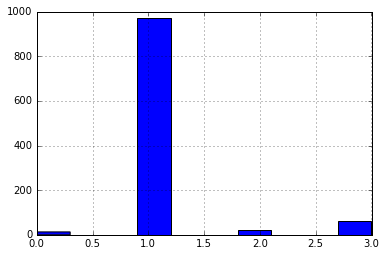

In [224]:
df.ACTION.apply( lambda a: [i for i, k in enumerate(u) if a == k][0]).hist()

In [140]:
s = '# Health Code Violations'
violations = df[['VIOLATION CODE','VIOLATION DESCRIPTION']].reset_index(drop=True)
violations = violations.drop_duplicates().sort_values('VIOLATION CODE')
violations = violations.set_index( violations['VIOLATION CODE'].apply( lambda s: str(s)[:2] ) )
for cat in violations.index.get_level_values(0).unique():
    cats = violations.loc[cat]
    if isinstance( cats, pandas.Series ):
        cats = cats.to_frame().transpose()
    s += jinja2.Template("""
## {{cat}}

{% for k, v in  df.iterrows() %}
* __{{v['VIOLATION CODE']}}__ - {{v['VIOLATION DESCRIPTION']}}
{% endfor %}
    """).render(cat=cat, df=cats)
    
IPython.display.Markdown(s)

# Health Code Violations
## 02


* __02A__ - Food not cooked to required minimum temperature.

* __02B__ - Hot food item not held at or above 140å¼ F.

* __02G__ - Cold food item held above 41å¼ F (smoked fish and reduced oxygen packaged foods above 38 å¼F) except during necessary preparation.

* __02H__ - Food not cooled by an approved method whereby the internal product temperature is reduced from 140å¼ F to 70å¼ F or less within 2 hours, and from 70å¼ F to 41å¼ F or less within 4 additional hours.

    
## 03


* __03A__ - Food from unapproved or unknown source or home canned. Reduced oxygen packaged (ROP) fish not frozen before processing; or ROP foods prepared on premises transported to another site.

* __03B__ - Shellfish not from approved source, improperly tagged/labeled; tags not retained for 90 days.

* __03C__ - Eggs found dirty/cracked; liquid, frozen or powdered eggs not pasteurized.

    
## 04


* __04A__ - Food Protection Certificate not held by supervisor of food operations.

* __04C__ - Food worker does not use proper utensil to eliminate bare hand contact with food that will not receive adequate additional heat treatment.

* __04E__ - Toxic chemical improperly labeled, stored or used such that food contamination may occur.

* __04H__ - Raw, cooked or prepared food is adulterated, contaminated, cross-contaminated, or not discarded in accordance with HACCP plan.

* __04J__ - Appropriately scaled metal stem-type thermometer or thermocouple not provided or used to evaluate temperatures of potentially hazardous foods during cooking, cooling, reheating and holding.

* __04L__ - Evidence of mice or live mice present in facility's food and/or non-food areas.

* __04M__ - Live roaches present in facility's food and/or non-food areas.

* __04N__ - Filth flies or food/refuse/sewage-associated (FRSA) flies present in facilitys food and/or non-food areas. Filth flies include house flies, little house flies, blow flies, bottle flies and flesh flies. Food/refuse/sewage-associated flies include fruit flies, drain flies and Phorid flies.

    
## 05


* __05D__ - Hand washing facility not provided in or near food preparation area and toilet room. Hot and cold running water at adequate pressure to enable cleanliness of employees not provided at facility. Soap and an acceptable hand-drying device not provided.

* __05F__ - Insufficient or no refrigerated or hot holding equipment to keep potentially hazardous foods at required temperatures.

    
## 06


* __06A__ - Personal cleanliness inadequate. Outer garment soiled with possible contaminant.  Effective hair restraint not worn in an area where food is prepared.

* __06B__ - Tobacco use, eating, or drinking from open container in food preparation, food storage or dishwashing area observed.

* __06C__ - Food not protected from potential source of contamination during storage, preparation, transportation, display or service.

* __06D__ - Food contact surface not properly washed, rinsed and sanitized after each use and following any activity when contamination may have occurred.

* __06E__ - Sanitized equipment or utensil, including in-use food dispensing utensil, improperly used or stored.

* __06F__ - Wiping cloths soiled or not stored in sanitizing solution.

    
## 08


* __08A__ - Facility not vermin proof. Harborage or conditions conducive to attracting vermin to the premises and/or allowing vermin to exist.

* __08B__ - Covered garbage receptacle not provided or inadequate, except that garbage receptacle may be uncovered during active use. Garbage storage area not properly constructed or maintained; grinder or compactor dirty.

* __08C__ - Pesticide use not in accordance with label or applicable laws. Prohibited chemical used/stored. Open bait station used.

    
## 09


* __09A__ - Canned food product observed dented and not segregated from other consumable food items.

* __09B__ - Thawing procedures improper.

* __09C__ - Food contact surface not properly maintained.

    
## 10


* __10A__ - Toilet facility not maintained and provided with toilet paper, waste receptacle and self-closing door.

* __10B__ - Plumbing not properly installed or maintained; anti-siphonage or backflow prevention device not provided where required; equipment or floor not properly drained; sewage disposal system in disrepair or not functioning properly.

* __10C__ - Lighting inadequate; permanent lighting not provided in food preparation areas, ware washing areas, and storage rooms.

* __10D__ - Mechanical or natural ventilation system not provided, improperly installed, in disrepair and/or fails to prevent excessive build-up of grease, heat, steam condensation vapors, odors, smoke, and fumes.

* __10E__ - Accurate thermometer not provided in refrigerated or hot holding equipment.

* __10F__ - Non-food contact surface improperly constructed. Unacceptable material used. Non-food contact surface or equipment improperly maintained and/or not properly sealed, raised, spaced or movable to allow accessibility for cleaning on all sides, above and underneath the unit.

* __10G__ - Food service operation occurring in room used as living or sleeping quarters.

* __10H__ - Proper sanitization not provided for utensil ware washing operation.

* __10I__ - Single service item reused, improperly stored, dispensed; not used when required.

* __10J__ - ''''Wash hands sign not posted at hand wash facility.

    
## 15


* __15L__ - Smoke free workplace smoking policy inadequate, not posted, not provided to employees.

    
## 16


* __16A__ - A food containing artificial trans fat, with 0.5 grams or more of trans fat per serving, is being stored, distributed, held for service, used in preparation of a menu item, or served.

* __16B__ - The original nutritional fact labels and/or ingredient label for a cooking oil, shortening or margarine or food item sold in bulk, or acceptable manufacturers documentation not maintained on site.

* __16C__ - Caloric content not posted on menus, menu boards or food tags, in a food service establishment that is 1 of 15 or more outlets operating the same type of business nationally under common ownership or control, or as a franchise or doing business under the same name, for each menu item that is served in portions, the size and content of which are standardized.

    
## 18


* __18D__ - Failure to comply with an Order of the Board of Health, Commissioner, or Department.

    
## 20


* __20A__ - Food allergy information poster not conspicuously posted where food is being prepared or processed by food workers.

* __20D__ - Choking first aid poster not posted. Alcohol and pregnancy warning sign not posted. Resuscitation equipment: exhaled air resuscitation masks (adult & pediatric), latex gloves, sign not posted. Inspection report sign not posted.

* __20E__ - Letter Grade or Grade Pending card not conspicuously posted and visible to passersby.

* __20F__ - Current letter grade card not posted.

    
## 22


* __22A__ - Nuisance created or allowed to exist. Facility not free from unsafe, hazardous, offensive or annoying conditions.

* __22C__ - Bulb not shielded or shatterproof, in areas where there is extreme heat, temperature changes, or where accidental contact may occur.

    
## na


* __nan__ - nan

    

In [141]:
df.describe()

,index,CAMIS,BUILDING,ZIPCODE,PHONE,SCORE
count,1066.000000,1066.000000,1066.000000,1066.000000,1.066000e+03,1001.000000
mean,218585.851782,41660276.269231,1656.683865,10306.822702,7.186389e+09,30.935065
std,122447.357902,1894529.283195,1541.612568,4.387722,2.278345e+06,16.348785
min,3624.000000,40366711.000000,19.000000,10301.000000,7.182734e+09,2.000000
25%,140973.250000,41160375.000000,238.000000,10303.000000,7.184485e+09,19.000000
50%,243231.500000,41447621.000000,1250.000000,10305.000000,7.185693e+09,27.000000
75%,317320.750000,41597047.000000,2945.000000,10310.000000,7.188157e+09,41.000000
max,426901.000000,50001339.000000,4326.000000,10314.000000,7.189848e+09,77.000000


In [142]:
df['vcat'] = df['VIOLATION CODE'].apply( lambda s: str(s)[:2] )

* [Pandas Groupyby operations](http://pandas.pydata.org/pandas-docs/stable/groupby.html)

In [144]:
bokeh.plotting.show(bokeh.charts.Bar( df, plot_width = 900, values='vcat', stack='vcat', label='CAMIS', agg='count', legend='top_left'))

In [152]:
violators_by_cat = df[['vcat','DBA']].groupby([df.vcat, df.CAMIS]).agg({'vcat':'count', 'DBA':'unique'})
violators_by_code = df[['vcat','DBA']].groupby([df['VIOLATION CODE'], df.CAMIS]).agg({'vcat':'count', 'DBA':'unique'})

In [153]:
violators_by_cat.loc['08'].sort_values('vcat', ascending=False)

,vcat,DBA
CAMIS,,
41257059,10,[PANADERIA LA MIXTECA POBLANA & DELI]
41596951,9,[THREE BROTHERS PIZZA]
40366711,8,[LI GRECI'S STAATEN RESTAURANT]
41197747,8,[BEST COFFEE SHOP]
40601738,8,[LA CANDELA ESPANOLA]
41507172,8,[BARI'S PIZZA & PASTA RESTAURANT]
41603176,7,[TU RANCHITO RESTAURANT]
50001339,7,[HIBACHI GRILL & SUPREME BUFFET]
40387243,6,[JIMMY MAX RESTAURANT]


In [154]:
violators_by_code.loc['08A'].sort_values('vcat', ascending=False)

,vcat,DBA
CAMIS,,
41257059,10,[PANADERIA LA MIXTECA POBLANA & DELI]
41596951,9,[THREE BROTHERS PIZZA]
40366711,8,[LI GRECI'S STAATEN RESTAURANT]
41197747,8,[BEST COFFEE SHOP]
50001339,7,[HIBACHI GRILL & SUPREME BUFFET]
40601738,7,[LA CANDELA ESPANOLA]
40387243,6,[JIMMY MAX RESTAURANT]
41507172,6,[BARI'S PIZZA & PASTA RESTAURANT]
41603176,6,[TU RANCHITO RESTAURANT]


In [156]:
bokeh.plotting.show(bokeh.charts.BoxPlot( df, plot_width = 900, label='CAMIS', values='SCORE'))

In [15]:
d = pandas.merge( df.set_index('CAMIS'), addresses.set_index('CAMIS'), left_index=True, right_index=True)
p = bokeh.models.GMapPlot(x_range=bokeh.models.DataRange1d(),y_range=bokeh.models.DataRange1d(),title='NYC Blech',
    map_options=bokeh.models.GMapOptions(
        lat=d['lat'].apply(lambda v: float(v)).mean(), lng=d['lon'].apply(lambda v: float(v)).mean(), map_type="roadmap", zoom=11
    ))
p.add_tools( bokeh.models.PanTool(), bokeh.models.WheelZoomTool() )
source = bokeh.plotting.ColumnDataSource(d)
renderer = p.add_glyph(source, bokeh.models.Circle(x='lon',y='lat',size=20))
#p.add_tools( bokeh.models.HoverTool(renderers=[renderer],tooltips='<table>'+''.join(['<tr><th>'+c +'</th><td>@'+c+'</td></tr>' for c in d.columns])+'</table>'))
bokeh.plotting.show(p)